# Animação da "Folha de Borracha": Rotação e Escala na Prática
## Monitoramento Angular durante a Deformação de Imagem

Neste notebook, combinaremos os dois conceitos anteriores: a deformação da imagem da Mona Lisa e o rastreamento dinâmico dos ângulos.

Ao invés de mostrar apenas o "Antes e Depois", interpolaremos a transformação para criar um vídeo onde o espaço é esticado gradativamente. 
Acompanharemos 4 vetores simultaneamente (dois autovetores e dois vetores comuns) e seus respectivos ângulos em relação ao eixo X para comprovar que **os autovetores não rotacionam, mesmo quando todo o espaço da imagem ao seu redor se deforma.**

In [7]:
import os
import requests
from io import BytesIO
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy import ndimage
from typing import Tuple, Optional
from IPython.display import HTML

# Semente e Cores (Paleta GRAN e Padronização de Textos)
np.random.seed(28)
COR_AZUL_PRINCIPAL = "#0D134C" # Vetores comuns (mudam de direção)
COR_VERMELHO = "#DD303E"       # Autovetores (mantêm a direção)
COR_BRANCO = "#FFFFFF"
COR_PRETO = "#000000"         # Títulos e legendas

# URL da Mona Lisa
IMAGE_URL = "https://upload.wikimedia.org/wikipedia/commons/thumb/e/ec/Mona_Lisa%2C_by_Leonardo_da_Vinci%2C_from_C2RMF_retouched.jpg/402px-Mona_Lisa%2C_by_Leonardo_da_Vinci%2C_from_C2RMF_retouched.jpg"
IMAGE_PATH_LOCAL = "../data/mona_lisa_sample.jpg"

def carregar_imagem(url: str, local_path: str) -> Optional[np.ndarray]:
    """Lê a imagem local ou faz o download seguro se não existir."""
    if os.path.exists(local_path):
        return np.array(Image.open(local_path).convert('L'))
    try:
        headers = {'User-Agent': 'Mozilla/5.0'}
        response = requests.get(url, headers=headers, timeout=15)
        response.raise_for_status()
        img_pil = Image.open(BytesIO(response.content)).convert('L')
        os.makedirs(os.path.dirname(local_path), exist_ok=True)
        img_pil.save(local_path)
        return np.array(img_pil)
    except Exception as e:
        print(f"Erro ao obter imagem: {e}")
        raise FileNotFoundError("Imagem não encontrada.")

try:
    img_array = carregar_imagem(IMAGE_URL, IMAGE_PATH_LOCAL)
    print(f"Imagem base carregada. Dimensões: {img_array.shape}")
except FileNotFoundError:
    pass

Imagem base carregada. Dimensões: (599, 402)


## 1. Funções de Transformação Cartesiana

Reutilizamos o nosso motor de transformação cartesiana. A novidade é que ele será chamado dezenas de vezes (uma vez por frame) com matrizes de transformação intermediárias, simulando o alongamento progressivo do tecido da imagem.

In [8]:
def transformar_imagem_cartesiana(img: np.ndarray, matriz: np.ndarray) -> Tuple[np.ndarray, Tuple[float, float, float, float]]:
    """
    Mapeia a imagem considerando (0,0) no centro. 
    Retorna a imagem deformada e seu extent [min_x, max_x, min_y, max_y].
    """
    H, W = img.shape
    A_inv = np.linalg.inv(matriz)
    
    # Limites para não cortar a imagem
    corners = np.array([[-W/2, -H/2], [W/2, -H/2], [-W/2, H/2], [W/2, H/2]])
    new_corners = corners @ matriz.T
    min_x, max_x = new_corners[:, 0].min(), new_corners[:, 0].max()
    min_y, max_y = new_corners[:, 1].min(), new_corners[:, 1].max()
    out_W, out_H = int(np.ceil(max_x - min_x)), int(np.ceil(max_y - min_y))
    
    X, Y = np.meshgrid(np.linspace(min_x, max_x, out_W), np.linspace(max_y, min_y, out_H))
    
    orig_coords_flat = A_inv @ np.vstack((X.flatten(), Y.flatten()))
    
    cols = orig_coords_flat[0, :] + W/2
    rows = H/2 - orig_coords_flat[1, :] 
    
    img_transformada = ndimage.map_coordinates(img, np.vstack((rows, cols)), order=1, cval=255)
    img_transformada = img_transformada.reshape((out_H, out_W))
    
    return img_transformada, (min_x, max_x, min_y, max_y)

# Matriz A (direcionada ao rosto e alongando)
A = np.array([
    [1.1, -0.2],
    [-0.2, 1.4]
])

evals, evecs = np.linalg.eig(A)

## 2. Geração da Animação Dinâmica

A animação transitará da matriz Identidade $I$ para a matriz $A$. 
Para manter a visualização fluida, fixaremos os eixos X e Y no tamanho máximo que a imagem atingirá ao final do estiramento. Plotaremos 4 vetores e acompanharemos os números formatados dinamicamente.

In [50]:
def animar_folha_de_borracha(img: np.ndarray, matriz_final: np.ndarray, frames: int = 40):
    print("Processando deformação em todos os frames. Isso pode levar alguns segundos...")
    
    # 1. Pré-calcular os limites máximos
    _, ext_final = transformar_imagem_cartesiana(img, matriz_final)
    W_orig = img.shape[1]
    C = W_orig * 0.45 
    
    # 2. Definição dos 4 Vetores de Origem
    # Dois Autovetores
    v_e1_orig = np.array([C * evecs[0, 0], C * evecs[1, 0]])
    v_e2_orig = np.array([C * evecs[0, 1], C * evecs[1, 1]])
    
    # Dois Vetores Comuns (Eixos X e Y)
    v_c1_orig = np.array([C * 0.7, 0.0])
    v_c2_orig = np.array([C * -0.8, C * 0.7])
    
    # 3. Configuração Visual do Gráfico
    fig, ax = plt.subplots(figsize=(10, 10), facecolor=COR_BRANCO)
    
    # Calculando margens consistentes
    pad_x = (ext_final[1] - ext_final[0]) * 0.08
    pad_y = (ext_final[3] - ext_final[2]) * 0.08
    ax.set_xlim(ext_final[0] - pad_x, ext_final[1] + pad_x)
    ax.set_ylim(ext_final[2] - pad_y, ext_final[3] + pad_y)
    
    ax.set_title("Deformação do Espaço e Análise Angular", fontsize=20, color=COR_PRETO, fontweight='bold', pad=20)
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.axhline(0, color='black', linewidth=1, alpha=0.5, ls='--')
    ax.axvline(0, color='black', linewidth=1, alpha=0.5, ls='--')
    
    # Plot Base
    extent_orig = (-img.shape[1]/2, img.shape[1]/2, -img.shape[0]/2, img.shape[0]/2)
    im_plot = ax.imshow(img, cmap='gray', extent=extent_orig)
    
    # Inicializa Quivers
    quiver_args = dict(angles='xy', scale_units='xy', alpha=0.6, scale=1, width=0.012)
    q_e1 = ax.quiver(0, 0, v_e1_orig[0], v_e1_orig[1], color=COR_VERMELHO, label="Autovetor (Fixo)", **quiver_args)
    q_e2 = ax.quiver(0, 0, v_e2_orig[0], v_e2_orig[1], color=COR_VERMELHO, **quiver_args)
    
    q_c1 = ax.quiver(0, 0, v_c1_orig[0], v_c1_orig[1], color=COR_AZUL_PRINCIPAL, label="Vetor Comum (Gira)", **quiver_args)
    q_c2 = ax.quiver(0, 0, v_c2_orig[0], v_c2_orig[1], color=COR_AZUL_PRINCIPAL, **quiver_args)
    
    # Pontos de ancoragem (X branco com opacidade baixa)
    marker_style = dict(marker='X', markersize=12, color='white', alpha=0.6, markeredgecolor='none')
    p_e1, = ax.plot([], [], **marker_style)
    p_e2, = ax.plot([], [], **marker_style)
    p_c1, = ax.plot([], [], **marker_style)
    p_c2, = ax.plot([], [], **marker_style)
    
    # Textos dos Ângulos
    offset_text = ext_final[1] * 0.04
    text_style = dict(fontsize=15, color=COR_PRETO, fontweight='bold', alpha=.6)
    
    box_e = dict(facecolor='white', alpha=0.6, edgecolor=COR_VERMELHO, boxstyle='round,pad=0.3')
    box_c = dict(facecolor='white', alpha=0.6, edgecolor=COR_AZUL_PRINCIPAL, boxstyle='round,pad=0.3')
    
    t_e1 = ax.text(0, 0, "", bbox=box_e, **text_style)
    t_e2 = ax.text(0, 0, "", bbox=box_e, **text_style)
    t_c1 = ax.text(0, 0, "", bbox=box_c, **text_style)
    t_c2 = ax.text(0, 0, "", bbox=box_c, **text_style)
    
    ax.legend(loc='lower left', fontsize=16, framealpha=0.95, edgecolor='black', labelcolor=COR_PRETO)

    def calcular_angulo(v):
        ang = np.degrees(np.arctan2(v[1], v[0]))
        return ang if ang >= 0 else ang + 360

    def update(frame: int):
        t = frame / (frames - 1)
        matriz_atual = np.eye(2) * (1 - t) + matriz_final * t
        
        # Atualiza Imagem
        img_transf, ext_transf = transformar_imagem_cartesiana(img, matriz_atual)
        im_plot.set_data(img_transf)
        im_plot.set_extent(ext_transf)
        
        # Transforma os 4 vetores
        v_e1 = matriz_atual @ v_e1_orig
        v_e2 = matriz_atual @ v_e2_orig
        v_c1 = matriz_atual @ v_c1_orig
        v_c2 = matriz_atual @ v_c2_orig
        
        # Atualiza Quivers
        q_e1.set_UVC(v_e1[0], v_e1[1])
        q_e2.set_UVC(v_e2[0], v_e2[1])
        q_c1.set_UVC(v_c1[0], v_c1[1])
        q_c2.set_UVC(v_c2[0], v_c2[1])
        
        # Atualiza Marcadores 'X'
        p_e1.set_data([v_e1[0]], [v_e1[1]])
        p_e2.set_data([v_e2[0]], [v_e2[1]])
        p_c1.set_data([v_c1[0]], [v_c1[1]])
        p_c2.set_data([v_c2[0]], [v_c2[1]])
        
        # Atualiza Textos (Formatação sem zero à esquerda: {:.1f})
        t_e1.set_text(f"{calcular_angulo(v_e1):.1f}°")
        t_e1.set_position((v_e1[0] - offset_text * 12, v_e1[1] - offset_text))
        
        t_e2.set_text(f"{calcular_angulo(v_e2):.1f}°")
        t_e2.set_position((v_e2[0] - offset_text * 4, v_e2[1] - offset_text * 5))
        
        t_c1.set_text(f"{calcular_angulo(v_c1):.1f}°")
        t_c1.set_position((v_c1[0] + offset_text * 3, v_c1[1] - offset_text))
        
        t_c2.set_text(f"{calcular_angulo(v_c2):.1f}°")
        t_c2.set_position((v_c2[0] - offset_text * 4, v_c2[1] + offset_text * 3))
        
        return [im_plot, q_e1, q_e2, q_c1, q_c2, 
                p_e1, p_e2, p_c1, p_c2, 
                t_e1, t_e2, t_c1, t_c2]

    ani = FuncAnimation(fig, update, frames=frames, interval=80, blit=True)
    plt.close()
    return ani

# Gera a animação
animacao = animar_folha_de_borracha(img_array, A, frames=40)
HTML(animacao.to_jshtml())

Processando deformação em todos os frames. Isso pode levar alguns segundos...


## 3. Comparação Estática Final (Para Material em PDF)

Para fins de documentação e exportação para PDF, a célula abaixo gera uma figura estática comparando o estado inicial (Matriz Identidade) e o estado final (Matriz A) lado a lado. Foram aplicadas as margens padrão do material e restaurados os 4 vetores de prova geométrica.

Sucesso: Figura final salva em ../outputs/aula_05/mona_lisa_comparacao_angular_final.png


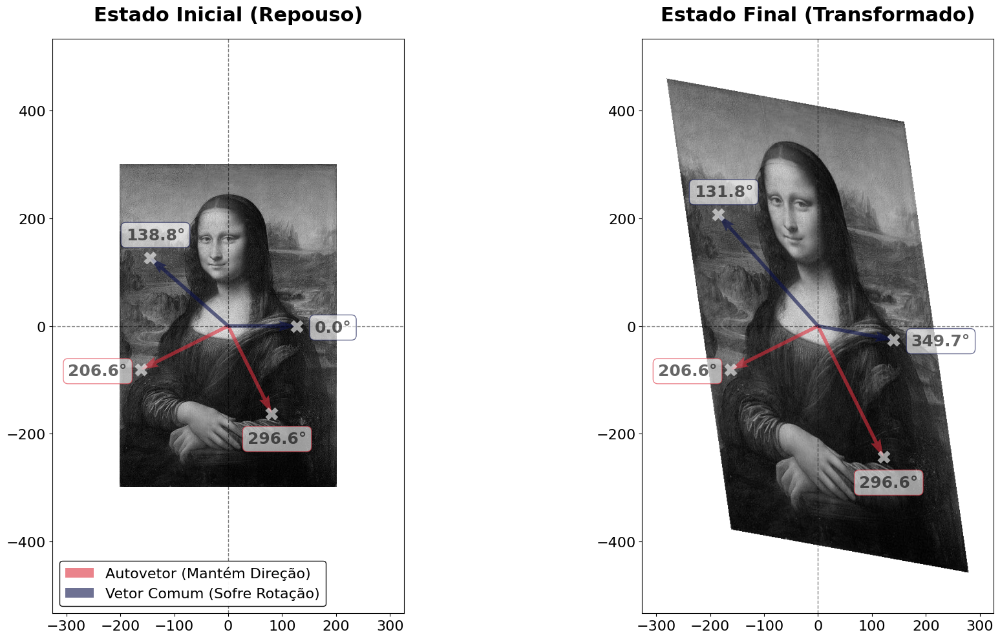

In [51]:
def plotar_comparacao_estatica(img_orig: np.ndarray, matriz_final: np.ndarray):
    """
    Gera plot estático lado a lado com as margens ajustadas para estilo de apostilas (PDF).
    """
    img_transf, ext_transf = transformar_imagem_cartesiana(img_orig, matriz_final)
    ext_orig = (-img_orig.shape[1]/2, img_orig.shape[1]/2, -img_orig.shape[0]/2, img_orig.shape[0]/2)
    
    fig, axes = plt.subplots(1, 2, figsize=(20, 10), facecolor=COR_BRANCO)
    
    axes[0].imshow(img_orig, cmap='gray', extent=ext_orig)
    axes[1].imshow(img_transf, cmap='gray', extent=ext_transf)
    
    # Títulos na cor preta
    axes[0].set_title("Estado Inicial (Repouso)", fontsize=22, color=COR_PRETO, fontweight='bold', pad=20)
    axes[1].set_title("Estado Final (Transformado)", fontsize=22, color=COR_PRETO, fontweight='bold', pad=20)
    
    # Parâmetros e Vetores (4 Vetores)
    W_orig = img_orig.shape[1]
    C = W_orig * 0.45
    
    v_e1_orig = np.array([C * evecs[0, 0], C * evecs[1, 0]])
    v_e2_orig = np.array([C * evecs[0, 1], C * evecs[1, 1]])
    v_c1_orig = np.array([C * 0.7, 0.0])
    v_c2_orig = np.array([C * -0.8, C * 0.7])
    
    offset_text = ext_transf[1] * 0.04
    
    def calcular_angulo(v):
        ang = np.degrees(np.arctan2(v[1], v[0]))
        return ang if ang >= 0 else ang + 360
        
    for ax, is_transf in zip(axes, [False, True]):
        ax.axhline(0, color='black', linewidth=1, alpha=0.5, ls='--')
        ax.axvline(0, color='black', linewidth=1, alpha=0.5, ls='--')
        ax.tick_params(axis='both', which='major', labelsize=16)
        
        # Calculando e aplicando a margem uniforme em ambos os gráficos
        pad_x = (ext_transf[1] - ext_transf[0]) * 0.08
        pad_y = (ext_transf[3] - ext_transf[2]) * 0.08
        ax.set_xlim(ext_transf[0] - pad_x, ext_transf[1] + pad_x)
        ax.set_ylim(ext_transf[2] - pad_y, ext_transf[3] + pad_y)
        
        matriz_atual = matriz_final if is_transf else np.eye(2)
        
        v_e1 = matriz_atual @ v_e1_orig
        v_e2 = matriz_atual @ v_e2_orig
        v_c1 = matriz_atual @ v_c1_orig
        v_c2 = matriz_atual @ v_c2_orig
        
        # Plots dos Autovetores (Vermelho)
        ax.quiver(0, 0, v_e1[0], v_e1[1], alpha=0.6, angles='xy', scale_units='xy', scale=1, color=COR_VERMELHO, width=0.010, label="Autovetor (Mantém Direção)" if not is_transf else "")
        ax.quiver(0, 0, v_e2[0], v_e2[1], alpha=0.6, angles='xy', scale_units='xy', scale=1, color=COR_VERMELHO, width=0.010)
        
        # Plots dos Vetores Comuns (Azul)
        ax.quiver(0, 0, v_c1[0], v_c1[1], alpha=0.6, angles='xy', scale_units='xy', scale=1, color=COR_AZUL_PRINCIPAL, width=0.010, label="Vetor Comum (Sofre Rotação)" if not is_transf else "")
        ax.quiver(0, 0, v_c2[0], v_c2[1], alpha=0.6, angles='xy', scale_units='xy', scale=1, color=COR_AZUL_PRINCIPAL, width=0.010)
        
        # Marcadores X
        m_args = dict(marker='X', markersize=14, color='white', alpha=0.6, markeredgecolor='none')
        ax.plot([v_e1[0]], [v_e1[1]], **m_args)
        ax.plot([v_e2[0]], [v_e2[1]], **m_args)
        ax.plot([v_c1[0]], [v_c1[1]], **m_args)
        ax.plot([v_c2[0]], [v_c2[1]], **m_args)
        
        # Textos
        txt_e = dict(fontsize=18, color=COR_PRETO, alpha=.6, fontweight='bold', bbox=dict(facecolor='white', alpha=0.60, edgecolor=COR_VERMELHO, boxstyle='round,pad=0.3'))
        txt_c = dict(fontsize=18, color=COR_PRETO, alpha=.6, fontweight='bold', bbox=dict(facecolor='white', alpha=0.60, edgecolor=COR_AZUL_PRINCIPAL, boxstyle='round,pad=0.3'))
        
        ax.text(v_e1[0] - offset_text * 12, v_e1[1] - offset_text * 1, f"{calcular_angulo(v_e1):.1f}°", **txt_e)
        ax.text(v_e2[0] - offset_text *  4, v_e2[1] - offset_text * 5, f"{calcular_angulo(v_e2):.1f}°", **txt_e)
        ax.text(v_c1[0] + offset_text *  3, v_c1[1] - offset_text * 1, f"{calcular_angulo(v_c1):.1f}°", **txt_c)
        ax.text(v_c2[0] - offset_text *  4, v_c2[1] + offset_text * 3, f"{calcular_angulo(v_c2):.1f}°", **txt_c)
        
    axes[0].legend(loc='lower left', fontsize=16, framealpha=0.95, edgecolor='black', labelcolor=COR_PRETO)
    
    plt.tight_layout()
    
    output_path = "../outputs/aula_05/mona_lisa_comparacao_angular_final.png"
    try:
        os.makedirs(os.path.dirname(output_path), exist_ok=True)
        plt.savefig(output_path, dpi=200, bbox_inches='tight')
        print(f"Sucesso: Figura final salva em {output_path}")
    except Exception as e:
        print(f"Erro ao salvar a imagem: {e}")
        
    plt.show()

plotar_comparacao_estatica(img_array, A)